In [1]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv('./output/panitumumab.csv', index_col=0)
df.shape

(52815, 4)

In [3]:
df.tail(10)

,mention,obj,prob,pmid
52805,tumor,disease,1.0000,11255078
52806,HER2 antibody,gene,0.9487,11255078
52807,HER2,gene,0.9950,11255078
52808,metastatic breast cancer,disease,1.0000,11255078
52809,ABX-EGF,gene,0.9560,11255078
52810,tumor,disease,0.8540,11255078
52811,ABX,gene,0.7330,11255078
52812,EGF,gene,0.9580,11255078
52813,solid tumors,disease,1.0000,11255078
52814,EGFr,gene,0.9937,11255078


# Data cleaning

In [4]:
counts = df['mention'].value_counts()
counts[counts >= 100]

panitumumab                         3521
EGFR                                3079
patients                            2370
cetuximab                           1742
KRAS                                1445
mCRC                                1420
metastatic colorectal cancer        1089
tumor                                948
bevacizumab                          789
RAS                                  758
colorectal cancer                    747
epidermal growth factor receptor     716
Panitumumab                          634
cancer                               628
BRAF                                 614
irinotecan                           565
CRC                                  544
oxaliplatin                          448
patient                              423
FOLFIRI                              337
tumors                               319
HER2                                 246
Cetuximab                            240
anti-EGFR                            209
tyrosine        

In [12]:
df.drop(df[df['mention'] == 'panitumumab'].index, inplace=True)
df.drop(df[df['mention'] == 'PATIENTS'].index, inplace=True)
df.drop(df[df['mention'] == 'patients'].index, inplace=True)
df.drop(df[df['mention'] == 'patient'].index, inplace=True)
df.drop(df[df['mention'] == 'Patients'].index, inplace=True)
df.drop(df[df['mention'] == 'Panitumumab'].index, inplace=True)
df.drop(df[df['mention'] == 'anti-'].index, inplace=True)
df.drop(df[df['pmid'] == 25424399].index, inplace=True)
df['mention'] = df['mention'].replace(['tumors'],'tumor')
df['mention'] = df['mention'].replace(['tumour'],'tumor')
df['mention'] = df['mention'].replace(['cancers'],'cancer')
df['mention'] = df['mention'].replace(['Cancer'],'cancer')
df['mention'] = df['mention'].replace(['epidermal growth factor receptor'],'EGFR')
df['mention'] = df['mention'].replace(['Epidermal growth factor receptor'],'EGFR')
df['mention'] = df['mention'].replace(['vascular endothelial growth factor'],'VEGF')
df['mention'] = df['mention'].replace(['anti-EGFR antibodies'],'anti-EGFR antibody')
df['mention'] = df['mention'].replace(['anti-epidermal growth factor receptor'],'anti-EGFR')
df['mention'] = df['mention'].replace(['Colorectal cancer'],'colorectal cancer')

<AxesSubplot:>

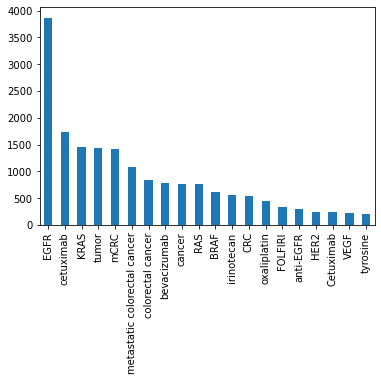

In [13]:
counts = df['mention'].value_counts()
counts[counts >= 200].plot.bar()

In [14]:
G = nx.from_pandas_edgelist(df, source='pmid', target='mention', edge_attr='obj')

degrees = dict(nx.degree(G))
nx.set_node_attributes(G, name='degree', values=degrees)
degree_df = pd.DataFrame(G.nodes(data='degree'), columns=['node', 'degree'])
degree_df = degree_df.sort_values(by='degree', ascending=False)
degree_df.describe()

,degree
count,10252.000000
mean,5.385291
std,22.925905
min,1.000000
25%,1.000000
50%,1.000000
75%,4.000000
max,1093.000000


In [15]:
# remove low-degree nodes
low_degree = [n for n, d in G.degree() if d < 4]
G.remove_nodes_from(low_degree)

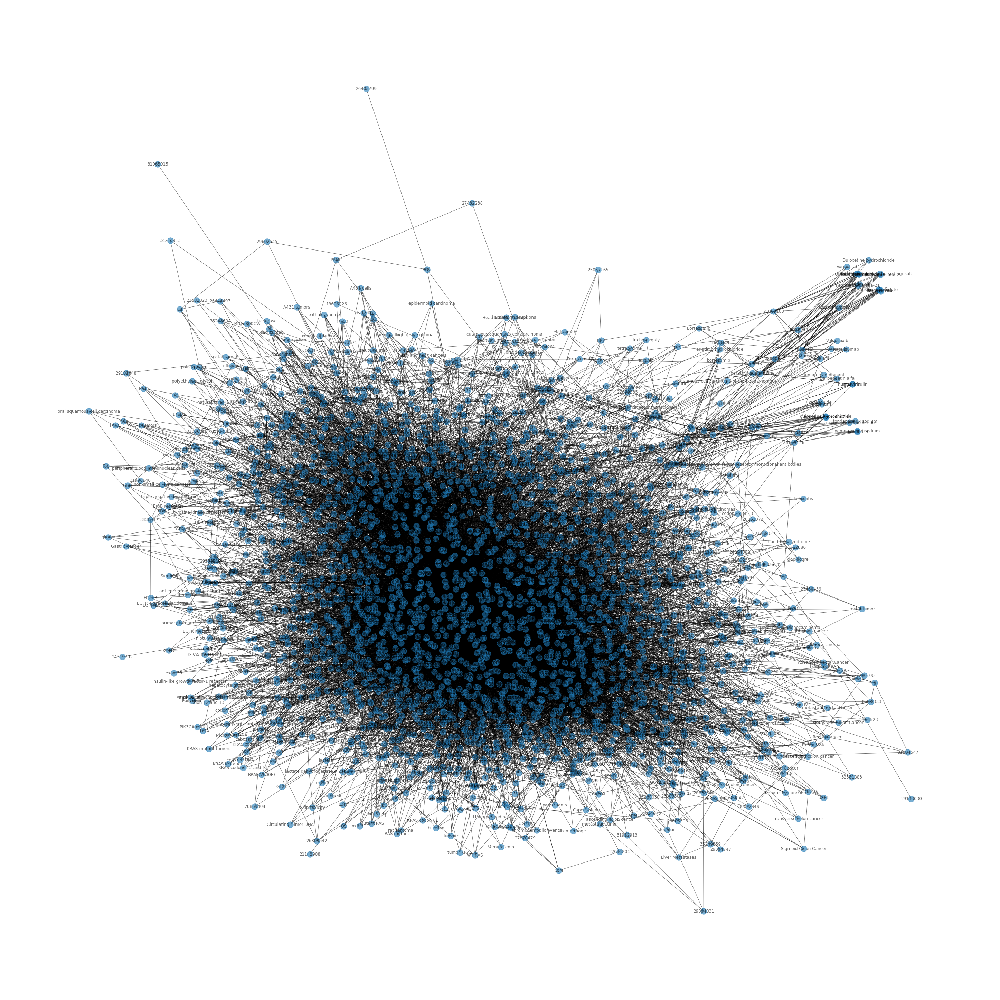

In [17]:
# Specify figure size
plt.figure(figsize=(40,40))

# Compute node position using the default spring_layout  
node_position = nx.spring_layout(G)
nx.draw(G, node_position, node_color='#F4ABAA', with_labels=True, alpha=0.5)

plt.show()

# Visualization of networks

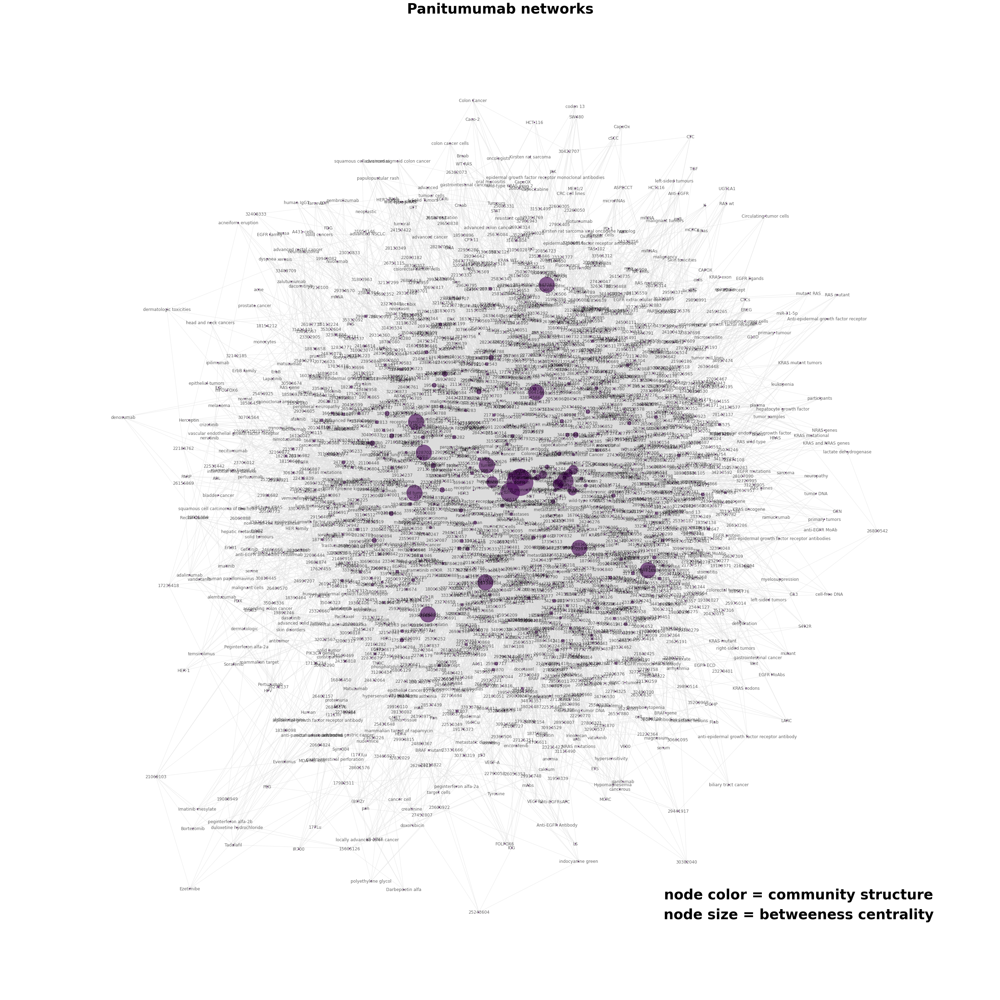

In [19]:
# largest connected component
components = nx.connected_components(G)
largest_component = max(components, key=len)
H = G.subgraph(largest_component)

# remove low-degree nodes
low_degree = [n for n, d in G.degree() if d < 5]
G.remove_nodes_from(low_degree)

# compute centrality
centrality = nx.betweenness_centrality(H, k=10, endpoints=True)

# compute community structure
lpc = nx.community.label_propagation_communities(H)
community_index = {n: i for i, com in enumerate(lpc) for n in com}

#### draw graph ####
fig, ax = plt.subplots(figsize=(40, 40))
pos = nx.spring_layout(H, k=0.15, seed=42)
node_color = [community_index[n] for n in H]
node_size = [v * 20000 for v in centrality.values()]
nx.draw_networkx(
    H,
    pos=pos,
    with_labels=True,
    node_color=node_color,
    node_size=node_size,
    edge_color="gainsboro",
    alpha=0.6
)

# Title/legend
font = {"color": "k", "fontweight": "bold", "fontsize": 40}
ax.set_title("Panitumumab networks", font)

# Change font color for legend
# font["color"] = "k"

ax.text(
    0.80,
    0.10,
    "node color = community structure",
    horizontalalignment="center",
    transform=ax.transAxes,
    fontdict=font,
)
ax.text(
    0.80,
    0.08,
    "node size = betweeness centrality",
    horizontalalignment="center",
    transform=ax.transAxes,
    fontdict=font,
)

# Resize figure for label readibility
ax.margins(0.1, 0.05)
fig.tight_layout()
plt.axis("off")
plt.show()